
# **Convolutions, Blurring and Sharpening Images**

####**In this lesson we'll learn:**
1. Convolution Operations
2. Blurring
3. Denoising
4. Sharpening

## **Great Blog**
- https://docs.opencv.org/3.4/d4/d86/group__imgproc__filter.html
- https://turcomat.org/index.php/turkbilmat/article/view/8765/6834
- https://www.kaggle.com/code/ahedjneed/15-image-filters-with-deployment-opencv-streamlit  (Advanced Filters)
- https://towardsdatascience.com/basics-of-kernels-and-convolutions-with-opencv-c15311ab8f55

In [1]:
# Our Setup, Import Libaries, Create our Imshow Function and Download our Images
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Define our imshow function 
def imshow(title = "Image", image = None, size = 10):
    h,w = image.shape[0], image.shape[1]
    aspect_ratio = h/w
    plt.figure(figsize=(size * aspect_ratio,size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.show()

# Download and unzip our images
!wget https://moderncomputervision.s3.eu-west-2.amazonaws.com/images.zip
!unzip -qq images.zip

--2023-04-30 06:17:40--  https://moderncomputervision.s3.eu-west-2.amazonaws.com/images.zip
Resolving moderncomputervision.s3.eu-west-2.amazonaws.com (moderncomputervision.s3.eu-west-2.amazonaws.com)... 52.95.148.194
Connecting to moderncomputervision.s3.eu-west-2.amazonaws.com (moderncomputervision.s3.eu-west-2.amazonaws.com)|52.95.148.194|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 29586716 (28M) [application/zip]
Saving to: ‘images.zip’

images.zip          100%[===================>]  28.22M  17.3MB/s    in 1.6s    

2023-04-30 06:17:42 (17.3 MB/s) - ‘images.zip’ saved [29586716/29586716]



### **Identity Kernel**

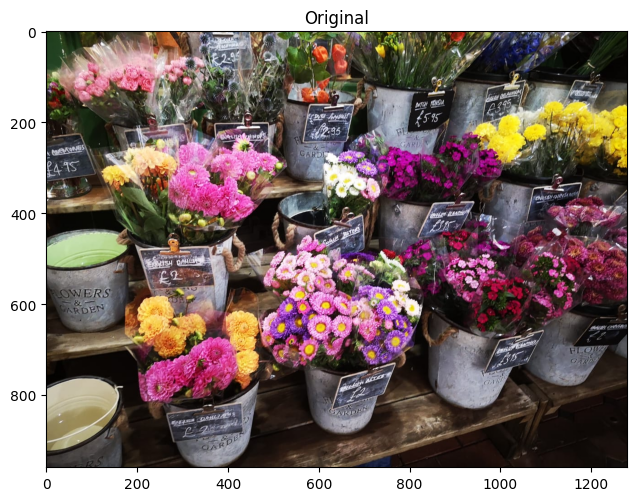

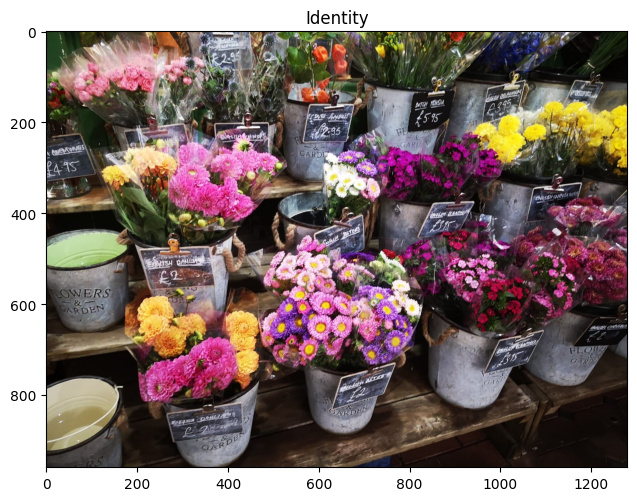

In [8]:
image = cv2.imread('images/flowers.jpeg')
kernel1 = np.array([[0, 0, 0],
                    [0, 1, 0],
                    [0, 0, 0]])
 
identity = cv2.filter2D(src=image, ddepth=-1, kernel=kernel1)
 
imshow('Original', image)
imshow('Identity', identity)

### **Blurring using Convolutions**

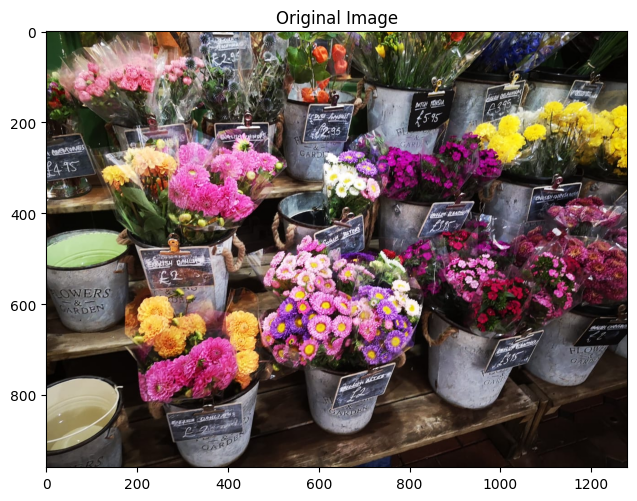

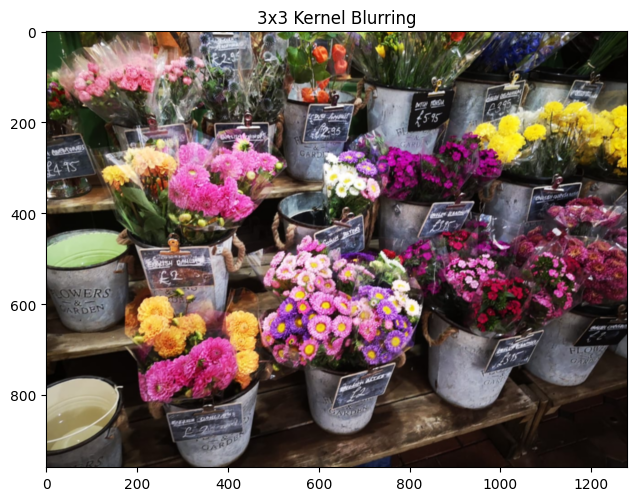

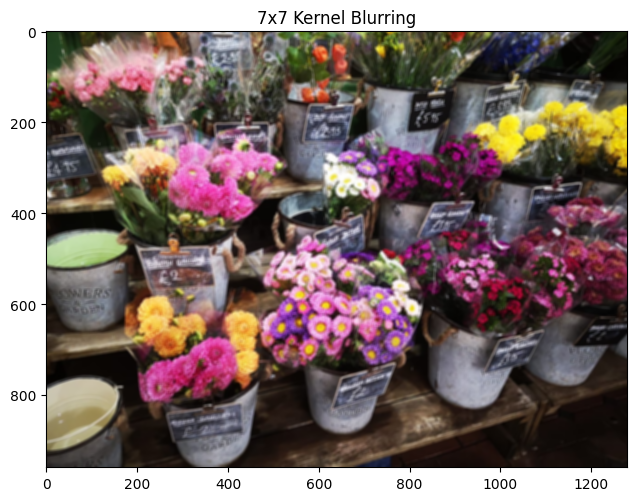

In [2]:
import cv2
import numpy as np

image = cv2.imread('images/flowers.jpeg')
imshow('Original Image', image)

# Creating our 3 x 3 kernel
kernel_3x3 = np.ones((3, 3), np.float32) / 9

# We use the cv2.fitler2D to conovlve the kernal with an image 
blurred = cv2.filter2D(image, -1, kernel_3x3)
imshow('3x3 Kernel Blurring', blurred)

# Creating our 7 x 7 kernel
kernel_7x7 = np.ones((7, 7), np.float32) / 49

blurred2 = cv2.filter2D(image, -1, kernel_7x7)
imshow('7x7 Kernel Blurring', blurred2)

### **Other commonly used blurring methods in OpenCV**
- Regular Blurring
- Gaussian Blurring
- Median Blurring

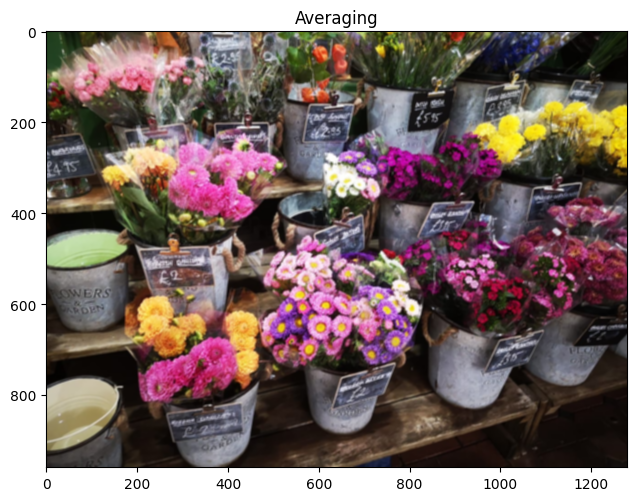

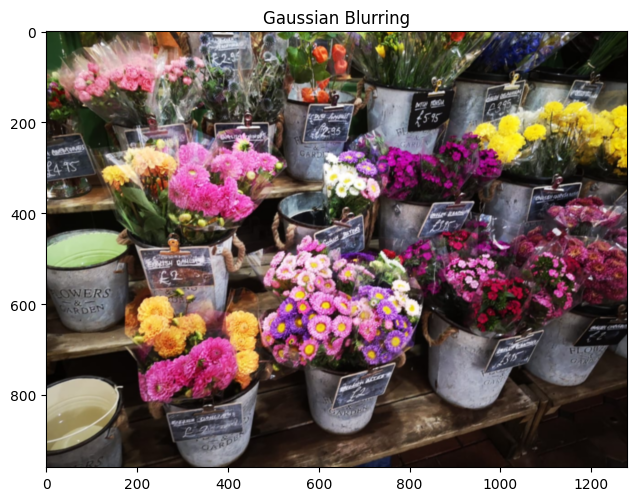

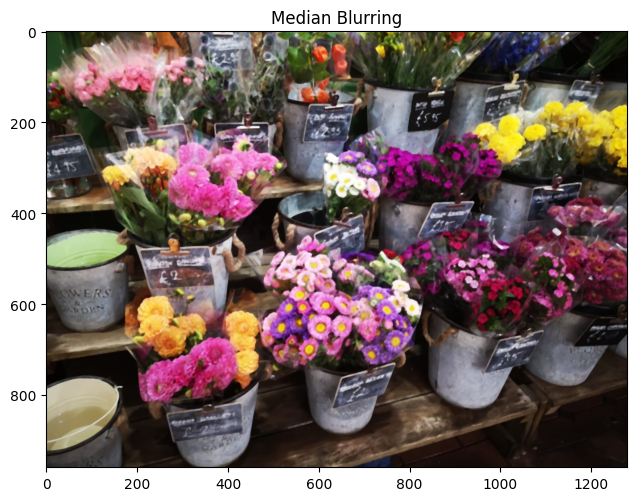

In [3]:
import cv2
import numpy as np

image = cv2.imread('images/flowers.jpeg')

# Averaging done by convolving the image with a normalized box filter. 
# This takes the pixels under the box and replaces the central element
# Box size needs to odd and positive 
### blur is same as box filter
blur = cv2.blur(image, (5,5))
imshow('Averaging', blur)

# Instead of box filter, gaussian kernel
Gaussian = cv2.GaussianBlur(image, (5,5), 0)
imshow('Gaussian Blurring', Gaussian)

# Takes median of all the pixels under kernel area and central 
# element is replaced with this median value
median = cv2.medianBlur(image, 5)
imshow('Median Blurring', median)

### **Noise Removal Using Median Blurring:**
- cv2.medianBlur() computes the median of all the pixels under the kernel window and replaces the central value with the median value. This filter is highly used to remove noise from the image.

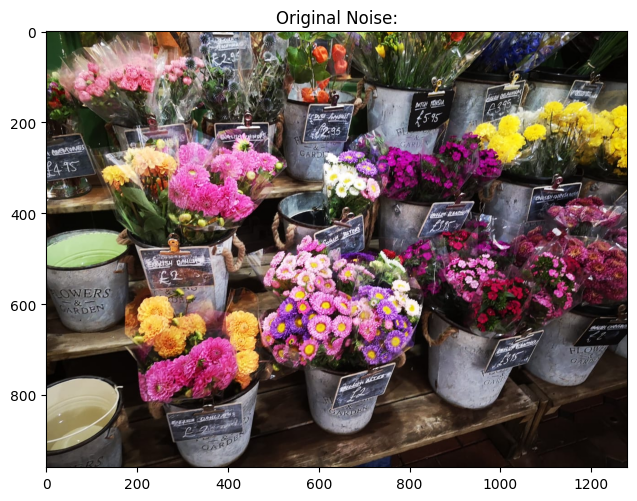

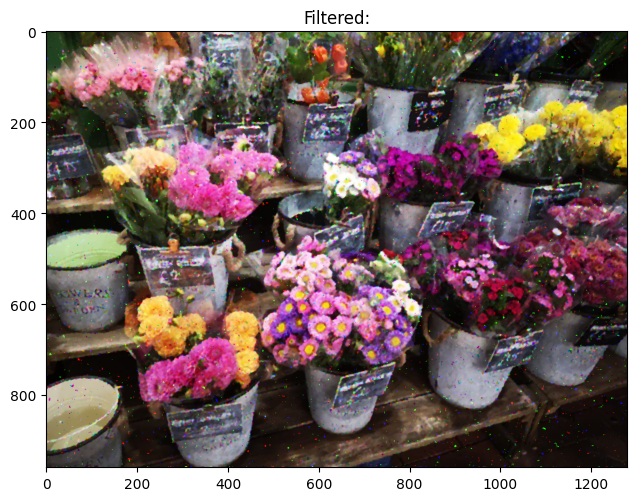

In [13]:
from skimage.util import random_noise
## adding noise
image = cv2.imread('images/flowers.jpeg')
noise_img = random_noise(image, mode='s&p',amount=0.5)
noise_img = np.array(255*noise_img, dtype = 'uint8')
## median filter
median = cv2.medianBlur(noise_img,5)

imshow('Original Noise:',image)
imshow('Filtered:',median)

### **Bilateral Filter** (better than median blur)
- While blurring can be an effective way to reduce noise in an image, it is often not desirable to blur the entire image, as important details and sharp edges may be lost. In such cases, bilateral filtering can make your life easier.
- This technique applies the filter selectively to blur similar intensity pixels in a neighborhood. Sharp edges are preserved, wherever possible.
- It lets you control not only the spatial size of the filter, but also the degree to which the neighboring pixels are included in the filtered output. This is done, based on variation in their color intensity, and also distance from the filtered pixel.
#### ```dst = cv.bilateralFilter(src, d, sigmaColor, sigmaSpace[, dst[, borderType]])```
- **src**	Source 8-bit or floating-point, 1-channel or 3-channel image.
- **dst**	Destination image of the same size and type as src .
- **d**	Defines the diameter of the pixel neighborhood used for filtering. If it is non-positive, it is computed from sigmaSpace.
- The next two arguments, **sigmaColor** and **sigmaSpace** define the standard deviation of the (1D) color-intensity distribution and (2D) spatial distribution respectively.
- The **sigmaSpace** parameter defines the spatial extent of the kernel, in both the x and y directions (just like the Gaussian blur filter previously described).
- The **sigmaColor** parameter defines the one-dimensional Gaussian distribution, which specifies the degree to which differences in pixel intensity can be tolerated.
- The final (weighted) value for a pixel in the filtered image is a product of its spatial and intensity weight. Thus,
- pixels that are similar and near the filtered pixel will have influence
- pixels that are far away from the filtered pixel will have little influence (due to the spatial Gaussian)
- pixels that have dissimilar intensities will have little influence (due to the color-intensity Gaussian), even if they are close to the center of the kernel.
- **borderType**	border mode used to extrapolate pixels outside of the image

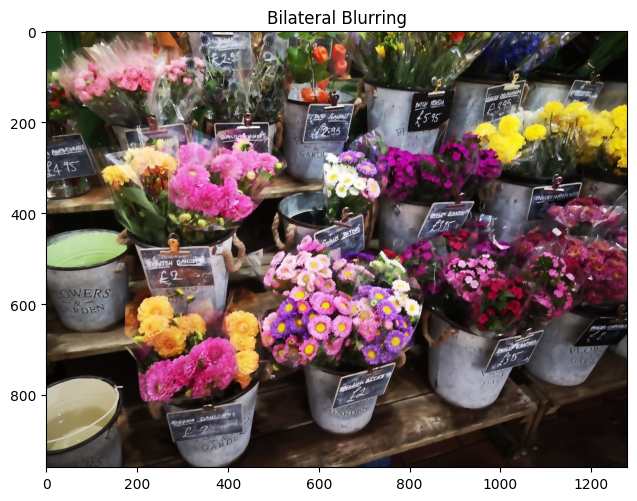

In [4]:
# Bilateral is very effective in noise removal while keeping edges sharp
bilateral = cv2.bilateralFilter(image, 9, 75, 75)
imshow('Bilateral Blurring', bilateral)

### **Emboss:**
- Forming a 3D design that pops out of the surface is called Emboss. It replaces the pixel with a shadow or a highlight. 
- Emboss means to form a mould a 3D mould that sticks out from the surface. When an emboss filter is applied to a picture, the resulting image resembles an emboss – a paper or metal emboss of the original image in which the features stand out in high relief (more prominently) or low relief (less prominently).

- The following kernel matrix can be used to apply to emboss filter:

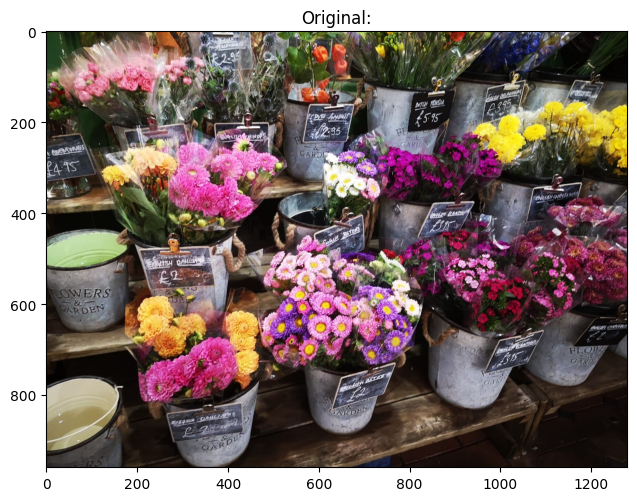

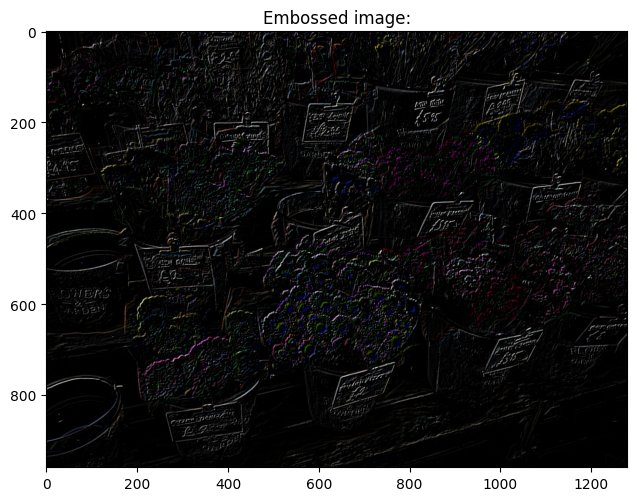

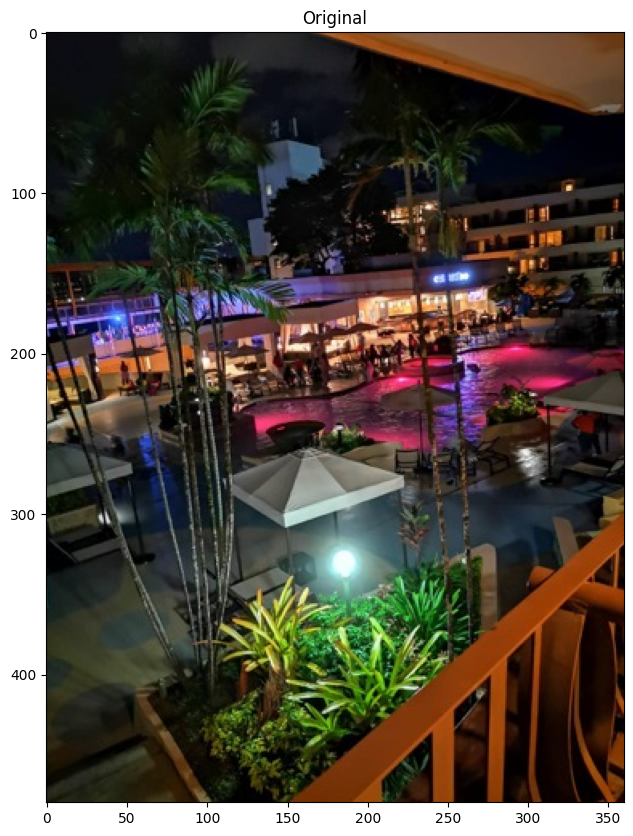

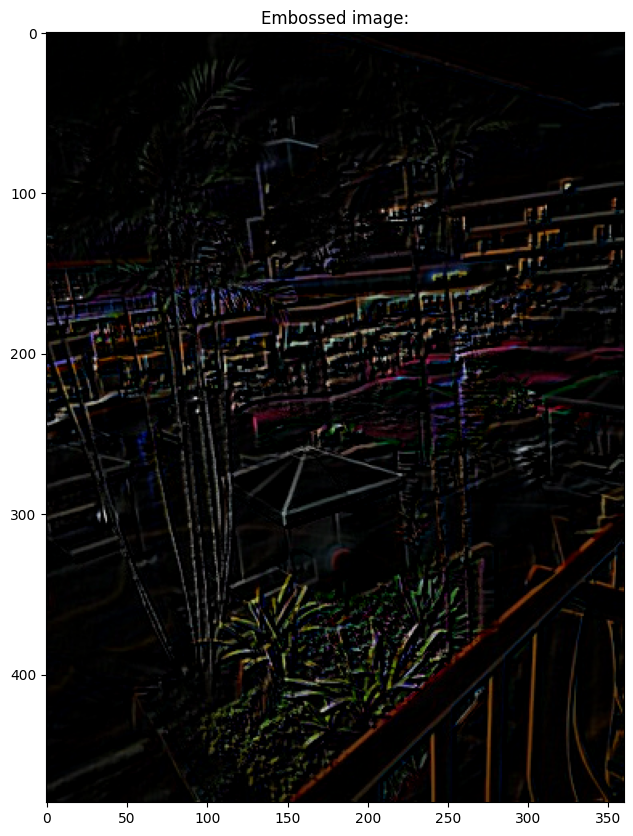

In [10]:
img = cv2.imread('images/flowers.jpeg')
image = cv2.imread('images/hilton.jpeg')

  
# Apply kernel for embossing
emboss_kernel = np.array([[-1, 0, 0],
                           [0, 0, 0],
                           [0, 0, 1]])
  
# Embossed image is obtained using the variable emboss_img
# cv2.fliter2D() is the function used
# src is the source of image(here, img)
# ddepth is destination depth. -1 will mean output image will have same depth as input image
# kernel is used for specifying the kernel operation (here, emboss_kernel)
emboss_img = cv2.filter2D(src=img, ddepth=-1, kernel=emboss_kernel)
emboss_image = cv2.filter2D(src=image, ddepth=-1, kernel=emboss_kernel)
  
# Showing the embossed image using matplotlib library function imshow()
imshow('Original:',img)
imshow('Embossed image:',emboss_img)
imshow('Original', image)
imshow('Embossed image:',emboss_image)

## **Image De-noising - Non-Local Means Denoising**

**There are 4 variations of Non-Local Means Denoising:**

- cv2.fastNlMeansDenoising() - works with a single grayscale images
- cv2.fastNlMeansDenoisingColored() - works with a color image.
- cv2.fastNlMeansDenoisingMulti() - works with image sequence captured in short period of time (grayscale images)
- cv2.fastNlMeansDenoisingColoredMulti() - same as above, but for color images.

```fastNlMeansDenoisingColored(InputArray src, OutputArray dst, float h=3, float hColor=3, int templateWindowSize=7, int searchWindowSize=21 )¶```

#### Parameters for fastNlMeansDenoisingColored:	

- **src** – Input 8-bit 3-channel image.
- **dst** – Output image with the same size and type as src .
templateWindowSize – Size in pixels of the template patch that is used to compute weights. Should be odd. Recommended value 7 pixels
- **searchWindowSize** – Size in pixels of the window that is used to compute weighted average for given pixel. Should be odd. Affect performance linearly: greater searchWindowsSize - greater denoising time. Recommended value 21 pixels
- **h** – Parameter regulating filter strength for luminance component. Bigger h value perfectly removes noise but also removes image details, smaller h value preserves details but also preserves some noise
- **hColor** – The same as h but for color components. For most images value equals 10 will be enought to remove colored noise and do not distort colors

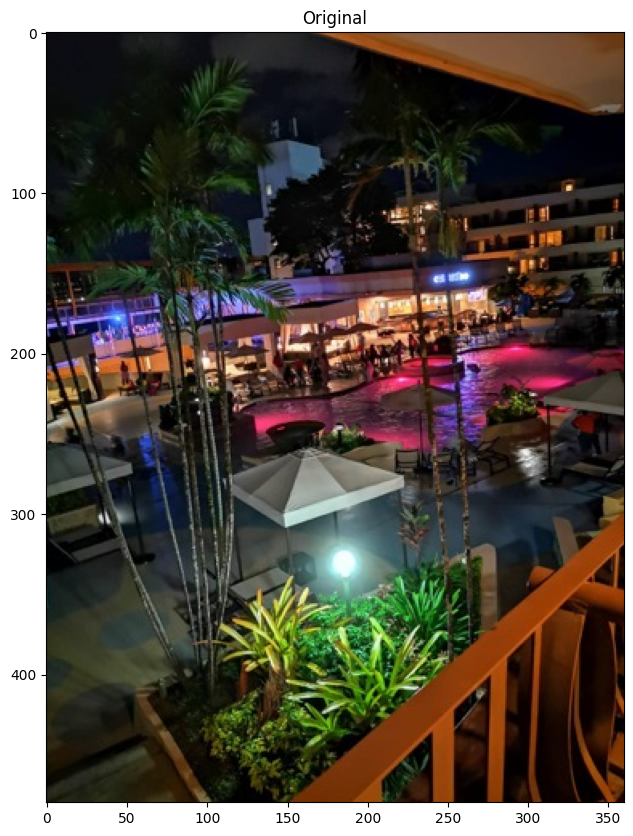

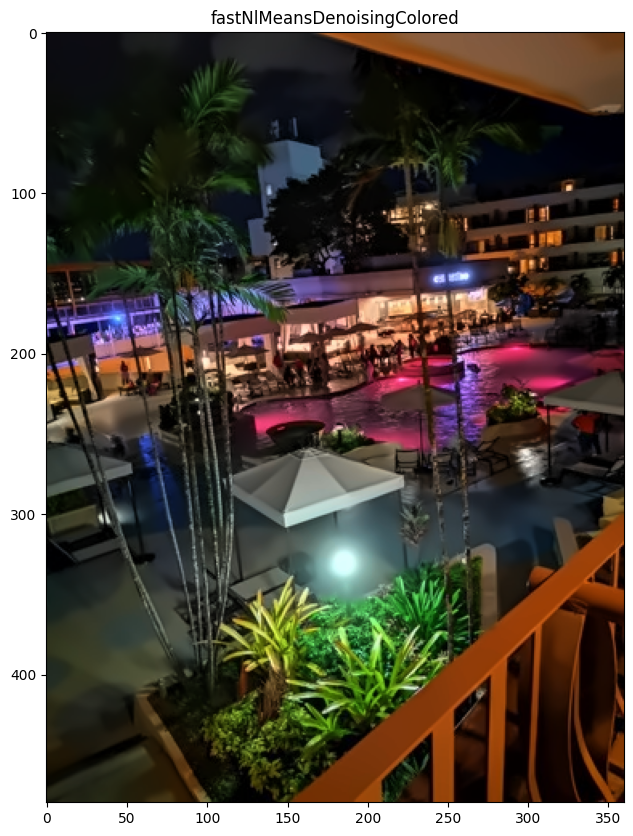

In [5]:
image = cv2.imread('images/hilton.jpeg')
imshow('Original', image)

dst = cv2.fastNlMeansDenoisingColored(image, None, 6, 6, 7, 21)
imshow('fastNlMeansDenoisingColored', dst)

### **Sharpening Images**
- Image sharpening is used to sharpen the image. There are three main reasons behind image sharpening:

1.  To overcome blurring introduced by the camera,
2. To draw attention to particular areas
3. To increase legibility.

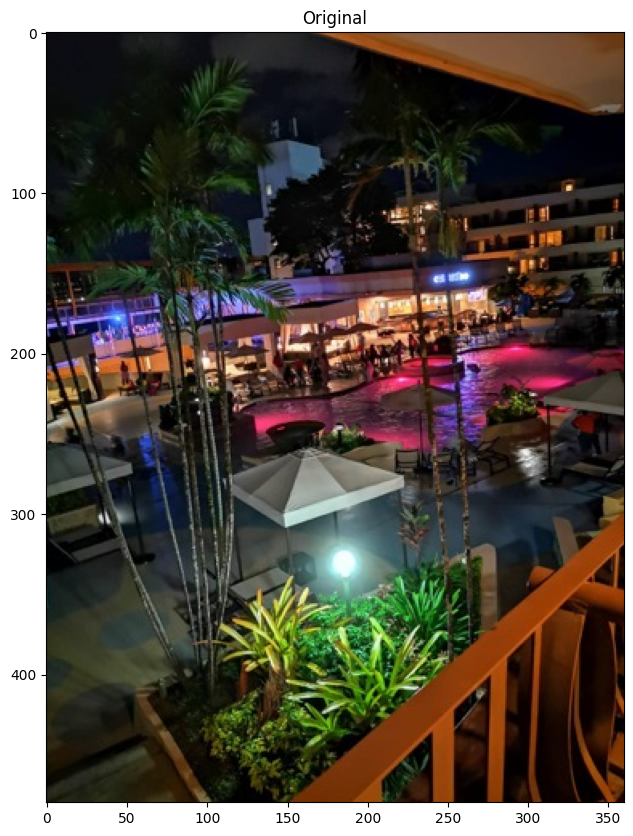

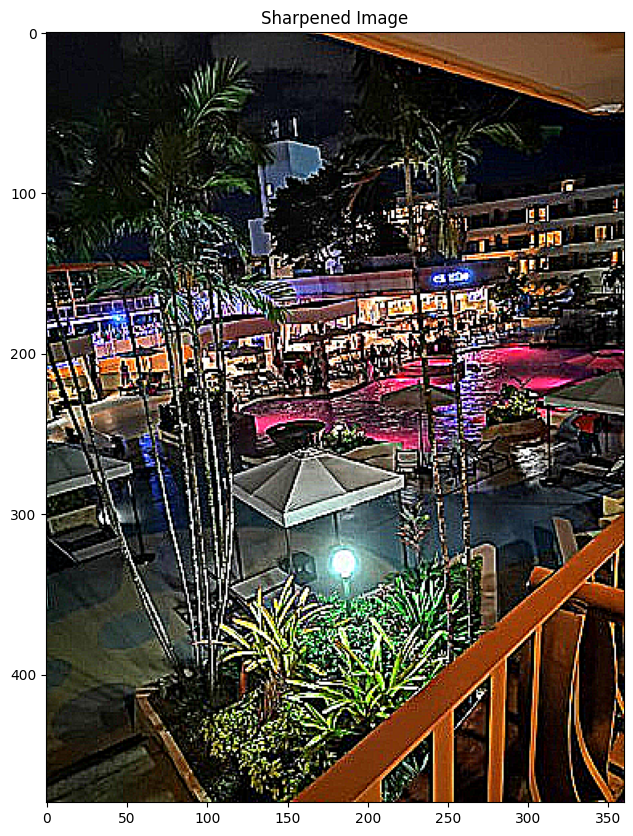

In [6]:
# Loading our image
image = cv2.imread('images/hilton.jpeg')
imshow('Original', image)

# Create our shapening kernel, remember it must sum to one 
kernel_sharpening = np.array([[-1,-1,-1], 
                              [-1, 9,-1],
                              [-1,-1,-1]])

# applying the sharpening kernel to the image
sharpened = cv2.filter2D(image, -1, kernel_sharpening)
imshow('Sharpened Image', sharpened)

### **Edge Detection:**


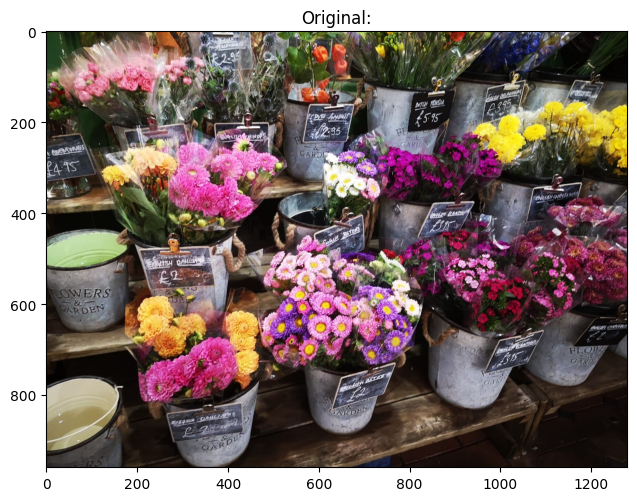

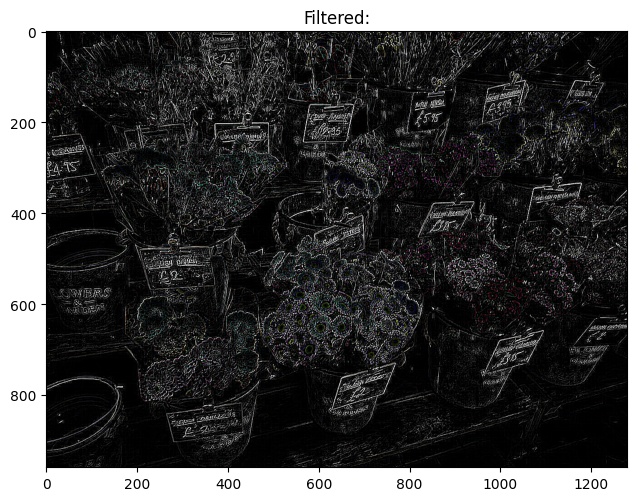

In [11]:
image = cv2.imread('images/flowers.jpeg')
kernel = np.array([[-1.0, -1.0, -1.0],
                       [-1.0, 8.0, -1.0],
                       [-1.0, -1.0, -1.0]])
dst = cv2.filter2D(image,-1,kernel)
imshow('Original:',image)
imshow('Filtered:',dst)